**10.Data Visualization and Storytelling**
*   **Create meaningful visualizations using data visualization tools.**
*   **Combine multiple visualizations to tell a compelling data story.**
* **Present the findings and insights in a clear and concise manner.**



**PRACTICAL NO 10**

**0. Setup and Data Loading**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc
from sklearn.inspection import DecisionBoundaryDisplay
from wordcloud import WordCloud
import squarify # pip install squarify

# Load data
df = pd.read_csv('/content/telco.csv')
sns.set(style="whitegrid")
print("Head of the Dataset :")
print(df.head())
print("Shape of the Dataset: ",df.shape)

Head of the Dataset :
  Customer ID  Gender  Age Under 30 Senior Citizen Married Dependents  \
0  8779-QRDMV    Male   78       No            Yes      No         No   
1  7495-OOKFY  Female   74       No            Yes     Yes        Yes   
2  1658-BYGOY    Male   71       No            Yes      No        Yes   
3  4598-XLKNJ  Female   78       No            Yes     Yes        Yes   
4  4846-WHAFZ  Female   80       No            Yes     Yes        Yes   

   Number of Dependents        Country       State  ...  \
0                     0  United States  California  ...   
1                     1  United States  California  ...   
2                     3  United States  California  ...   
3                     1  United States  California  ...   
4                     1  United States  California  ...   

  Total Extra Data Charges  Total Long Distance Charges  Total Revenue  \
0                       20                         0.00          59.65   
1                        0          

**1. Line Plot**

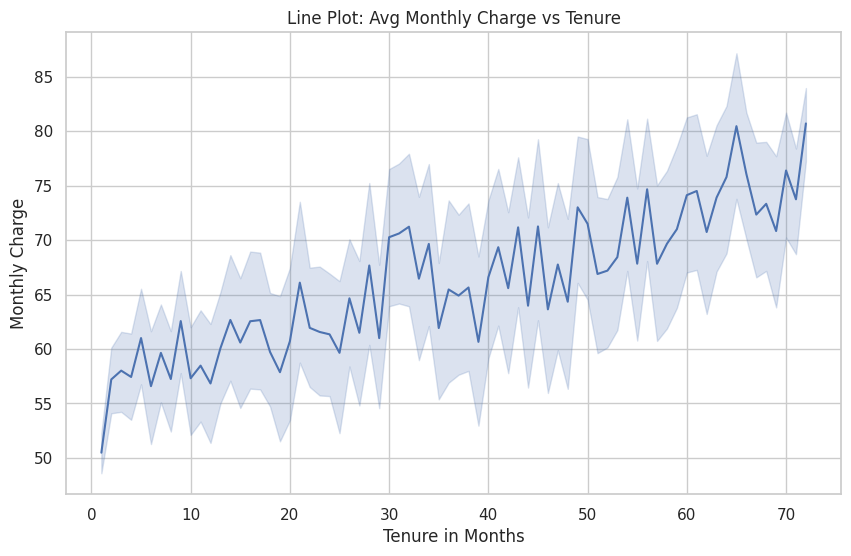

In [ ]:
# 1. Simple Line Plot: Avg Monthly Charge over Tenure
plt.figure(figsize=(10, 6))
sns.lineplot(data=df, x='Tenure in Months', y='Monthly Charge', estimator='mean')
plt.title('Line Plot: Avg Monthly Charge vs Tenure')
plt.show()

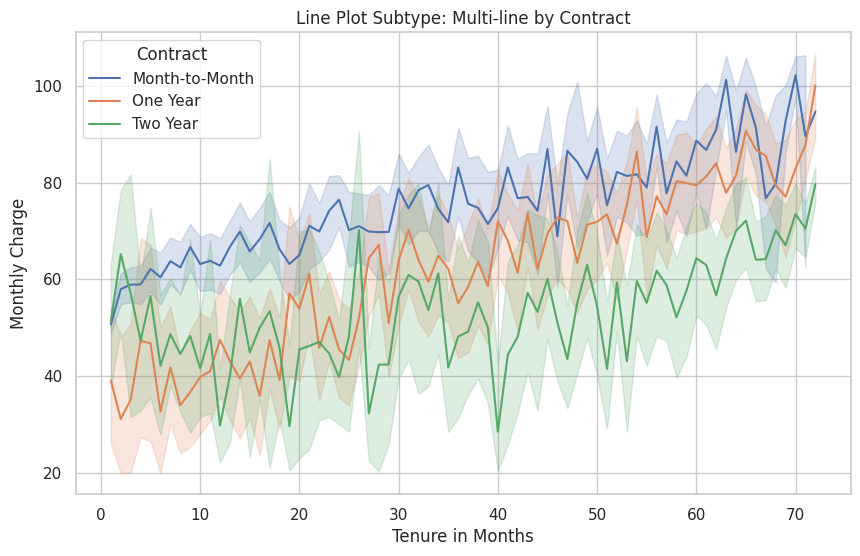

In [ ]:
# Subtype: Multi-line by Contract
plt.figure(figsize=(10, 6))
sns.lineplot(data=df, x='Tenure in Months', y='Monthly Charge', hue='Contract', estimator='mean')
plt.title('Line Plot Subtype: Multi-line by Contract')
plt.show()

**2. Bar Plot**

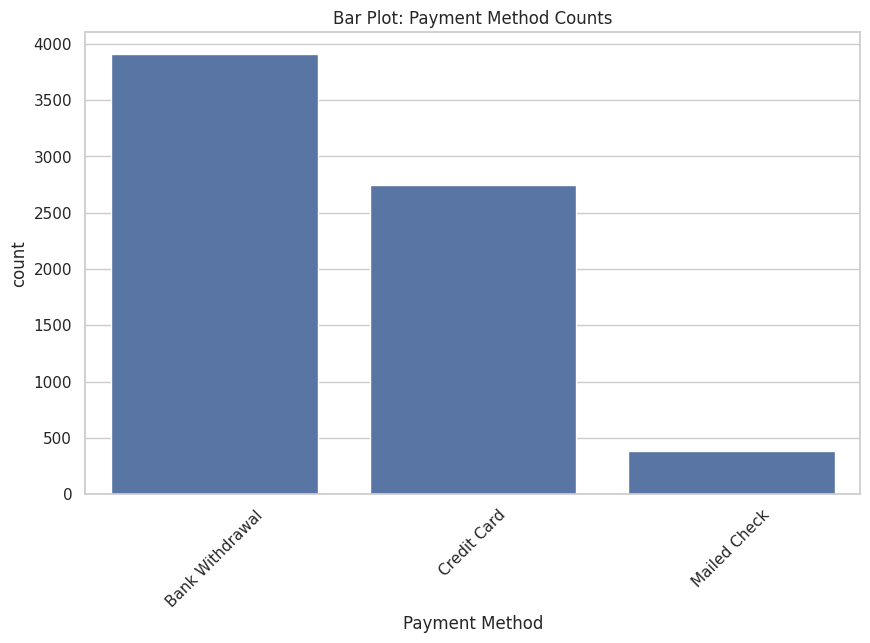

In [ ]:
# 2. Simple Vertical Bar Plot
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Payment Method')
plt.xticks(rotation=45)
plt.title('Bar Plot: Payment Method Counts')
plt.show()

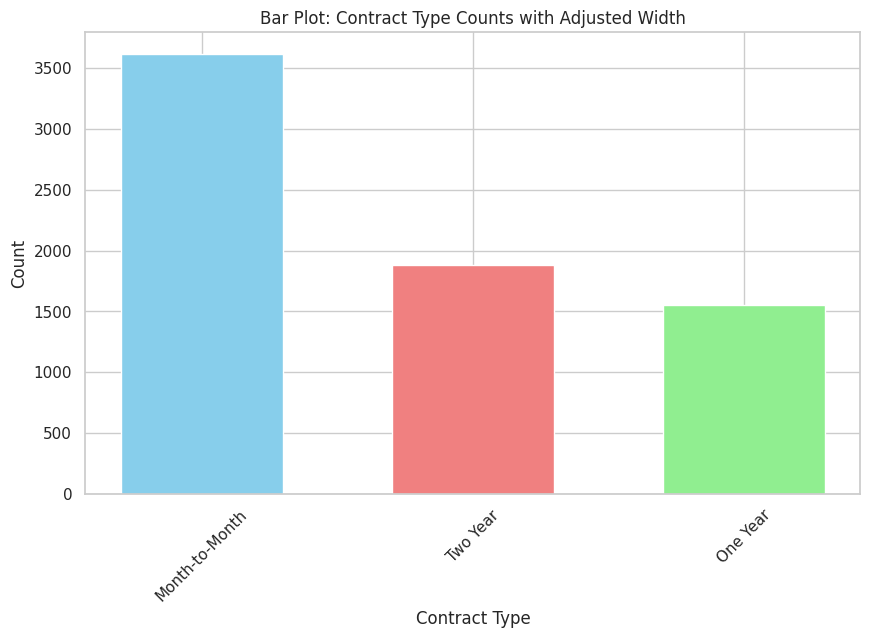

In [ ]:
# Adjusting Bar Width (Example using Contract type)
plt.figure(figsize=(10, 6))
contract_counts = df['Contract'].value_counts()
plt.bar(contract_counts.index, contract_counts.values, width=0.6, color=['skyblue', 'lightcoral', 'lightgreen'])
plt.xticks(rotation=45)
plt.title('Bar Plot: Contract Type Counts with Adjusted Width')
plt.xlabel('Contract Type')
plt.ylabel('Count')
plt.show()

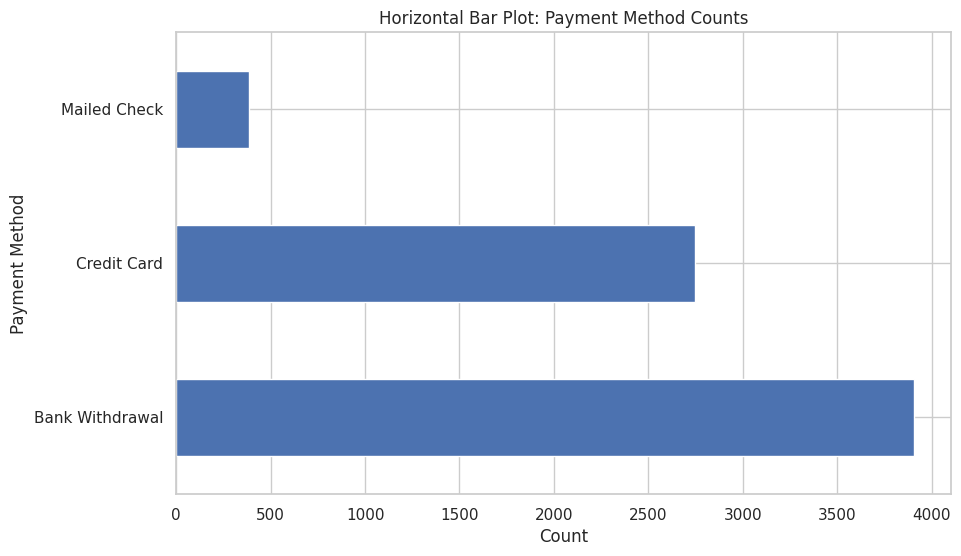

In [ ]:
# Horizontal Bar Plot
plt.figure(figsize=(10, 6))
# For horizontal plots, use `barh` and `value_counts()` directly for labels and values
df['Payment Method'].value_counts().plot.barh()
plt.title('Horizontal Bar Plot: Payment Method Counts')
plt.xlabel('Count')
plt.ylabel('Payment Method')
plt.show()

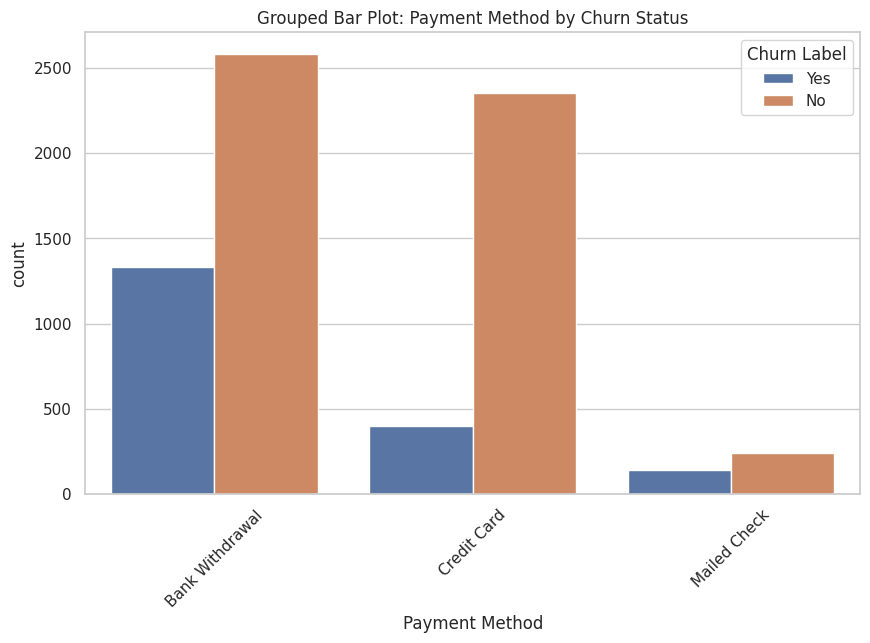

In [ ]:
# Subtype: Multiple Grouped Bar Plot (using Payment Method and Churn Label)
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Payment Method', hue='Churn Label')
plt.xticks(rotation=45)
plt.title('Grouped Bar Plot: Payment Method by Churn Status')
plt.show()

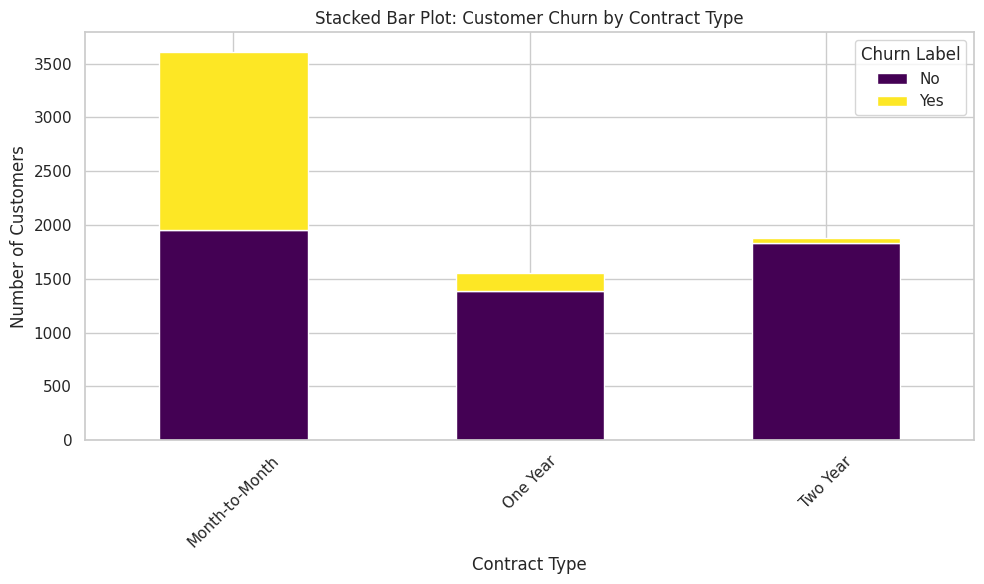

In [ ]:
# Subtype: Stacked Bar Plot (using Contract and Churn Label)
churn_contract_counts = df.groupby(['Contract', 'Churn Label']).size().unstack(fill_value=0)
churn_contract_counts.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='viridis')
plt.title('Stacked Bar Plot: Customer Churn by Contract Type')
plt.xlabel('Contract Type')
plt.ylabel('Number of Customers')
plt.xticks(rotation=45)
plt.legend(title='Churn Label')
plt.tight_layout()
plt.show()

**3. Histogram and Density Plots**

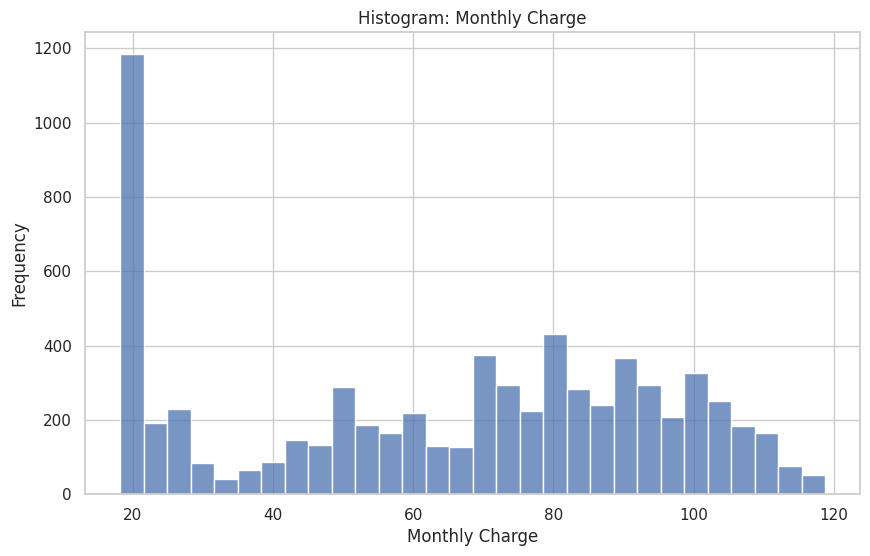

In [ ]:
# 3. Histogram Plot: Monthly Charge
plt.figure(figsize=(10, 6))
sns.histplot(df['Monthly Charge'], bins=30)
plt.title('Histogram: Monthly Charge')
plt.xlabel('Monthly Charge')
plt.ylabel('Frequency')
plt.show()

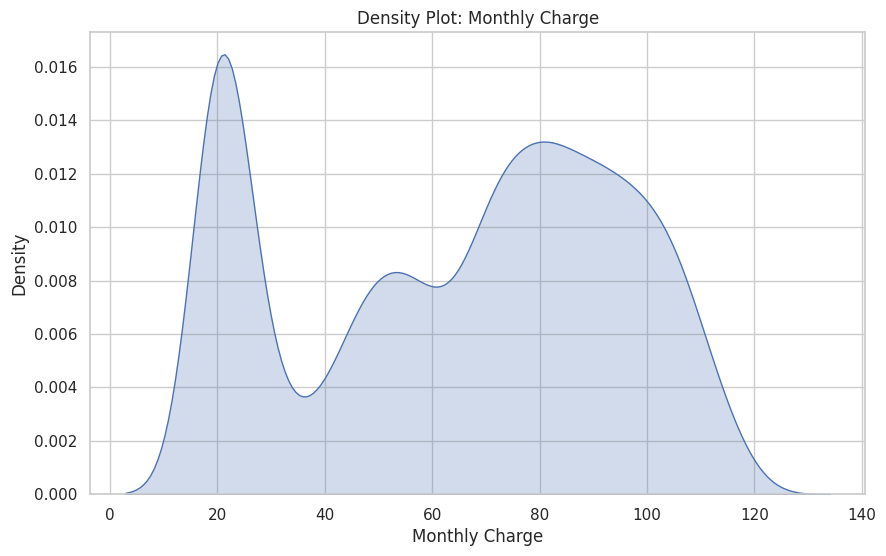

In [ ]:
# Density Plot: Monthly Charge
plt.figure(figsize=(10, 6))
sns.kdeplot(df['Monthly Charge'], fill=True)
plt.title('Density Plot: Monthly Charge')
plt.xlabel('Monthly Charge')
plt.ylabel('Density')
plt.show()

**4. Distribution Plot**

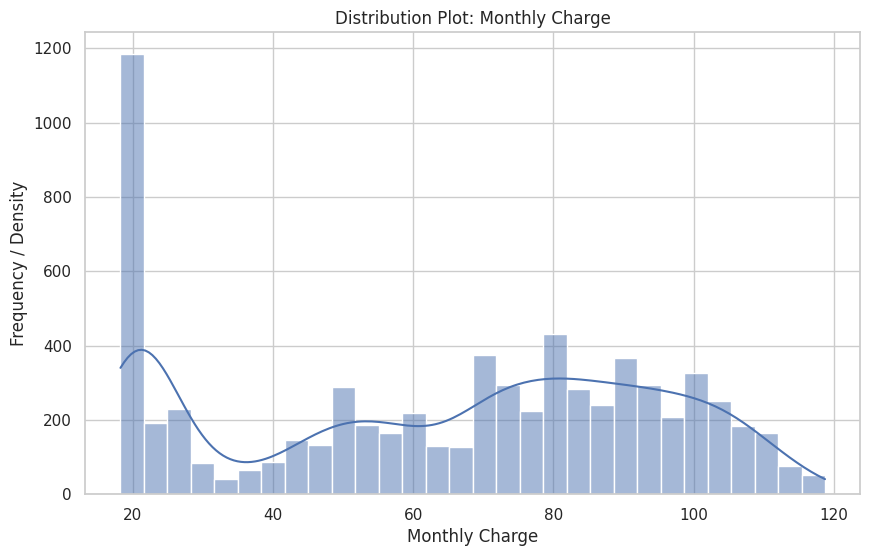

In [ ]:
# 3. Histogram and Density Plot Combined
plt.figure(figsize=(10, 6))
sns.histplot(df['Monthly Charge'], kde=True, bins=30)
plt.title('Distribution Plot: Monthly Charge')
plt.xlabel('Monthly Charge')
plt.ylabel('Frequency / Density')
plt.show()

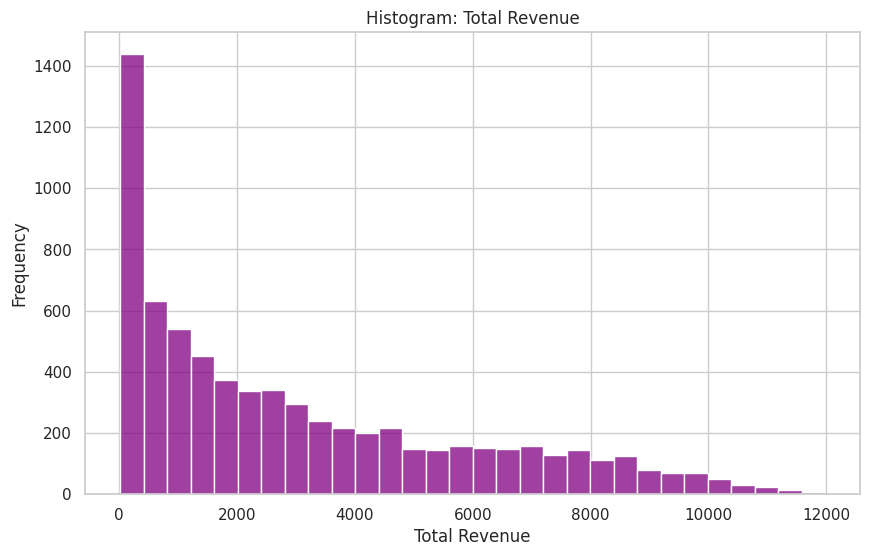

In [ ]:
# Histogram Plot: Total Revenue
plt.figure(figsize=(10, 6))
sns.histplot(df['Total Revenue'], bins=30, color='purple')
plt.title('Histogram: Total Revenue')
plt.xlabel('Total Revenue')
plt.ylabel('Frequency')
plt.show()

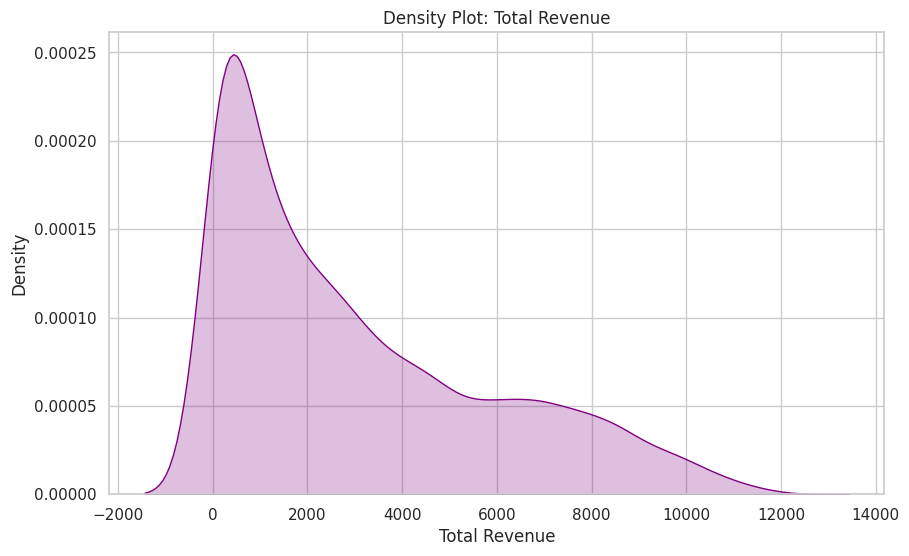

In [ ]:
# Density Plot: Total Revenue
plt.figure(figsize=(10, 6))
sns.kdeplot(df['Total Revenue'], fill=True, color='purple')
plt.title('Density Plot: Total Revenue')
plt.xlabel('Total Revenue')
plt.ylabel('Density')
plt.show()

**5. Scatter Plot**

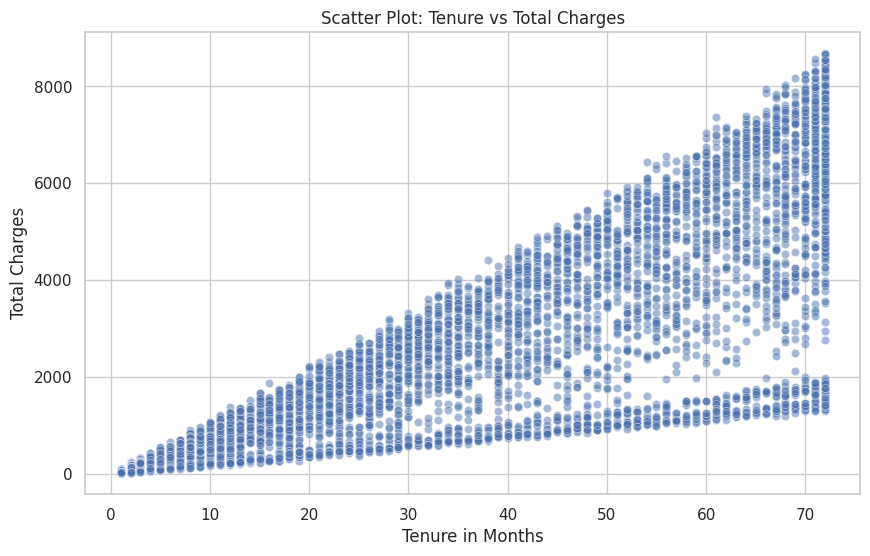

In [ ]:
# 4. Simple Scatter Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='Tenure in Months', y='Total Charges', alpha=0.5)
plt.title('Scatter Plot: Tenure vs Total Charges')
plt.show()

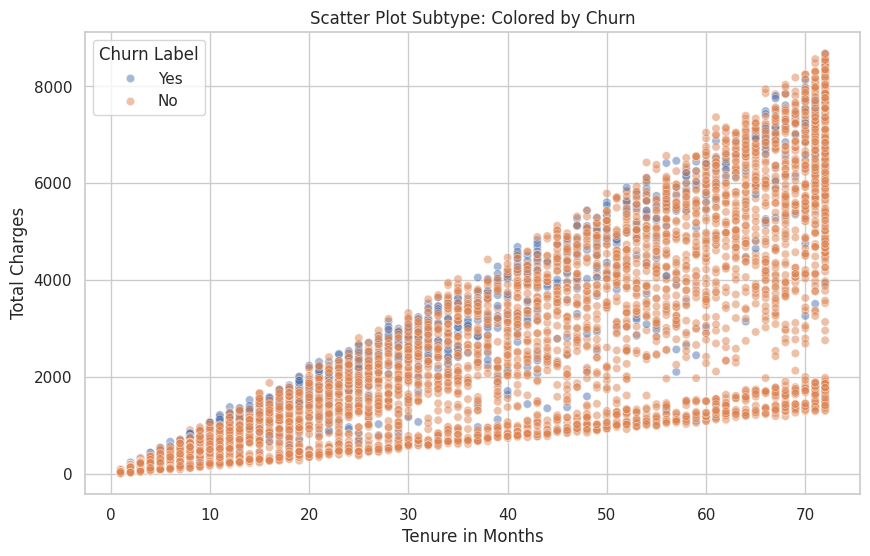

In [ ]:
# Subtype: Colored Scatter Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='Tenure in Months', y='Total Charges', hue='Churn Label', alpha=0.5)
plt.title('Scatter Plot Subtype: Colored by Churn')
plt.show()

**6. User Funnels**

In [ ]:
import plotly.graph_objects as go
import plotly.io as pio
pio.templates.default = "plotly_white"

# 5. User Funnel (Simulated using Tenure Buckets)
# Creating Tenure Buckets (bins are [start, end), e.g., 0-12 months)
df['Tenure Bucket'] = pd.cut(df['Tenure in Months'],
                             bins=[0, 12, 24, 36, 48, 60, 72],
                             labels=['0-1Y', '1-2Y', '2-3Y', '3-4Y', '4-5Y', '5-6Y'],
                             right=False)

# Define the funnel stages in a logical order
funnel_stages = ['0-1Y', '1-2Y', '2-3Y', '3-4Y', '4-5Y', '5-6Y']

num_users = []
num_conversions = [] # Customers who did NOT churn

for stage in funnel_stages:
    # Filter df for the current tenure bucket
    stage_df = df[df['Tenure Bucket'] == stage]

    # Number of total customers in this stage
    users_in_stage = len(stage_df)
    num_users.append(users_in_stage)

    # Number of 'conversions' (non-churned customers) in this stage
    # 'No' in 'Churn Label' indicates they did not churn
    conversions_in_stage = stage_df[stage_df['Churn Label'] == 'No'].shape[0]
    num_conversions.append(conversions_in_stage)

# Create a funnel chart
fig = go.Figure(go.Funnel(
    y=funnel_stages,
    x=num_users,
    textposition='inside',
    textinfo='value',
    name='Total Customers'
))

fig.add_trace(go.Funnel(
    y=funnel_stages,
    x=num_conversions,
    textposition='inside',
    textinfo='value',
    name='Retained Customers (No Churn)'
))

fig.update_layout(
    title='Funnel Analysis: Customer Retention by Tenure Bucket',
    funnelmode='stack',
    yaxis_title='Tenure Bucket',
    xaxis_title='Number of Customers',
    width=1000,  # Increase plot width
    height=700   # Increase plot height
)

fig.show()

**7. Heatmap**

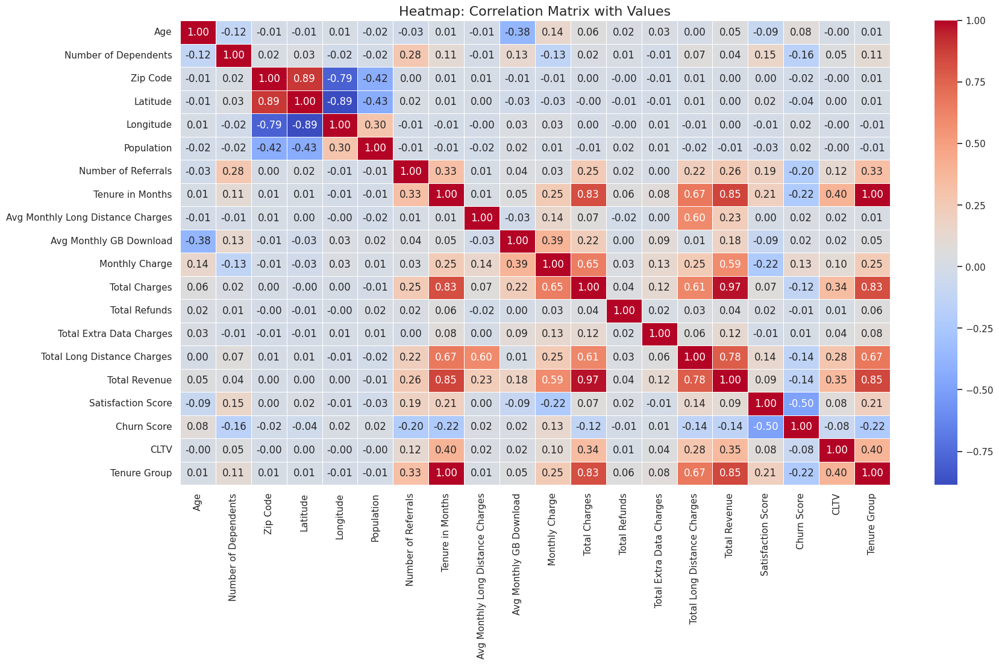

In [ ]:
# 6. Correlation Heatmap
plt.figure(figsize=(19, 10)) # Increased figure size for better readability with annotations
numeric_cols = df.select_dtypes(include=[np.number]).columns
corr = df[numeric_cols].corr()
sns.heatmap(corr, cmap='coolwarm', annot=True, fmt=".2f", linewidths=.5) # annot=True to show values, fmt=".2f" for formatting
plt.title('Heatmap: Correlation Matrix with Values', fontsize=16)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()

**8. Pie Chart**

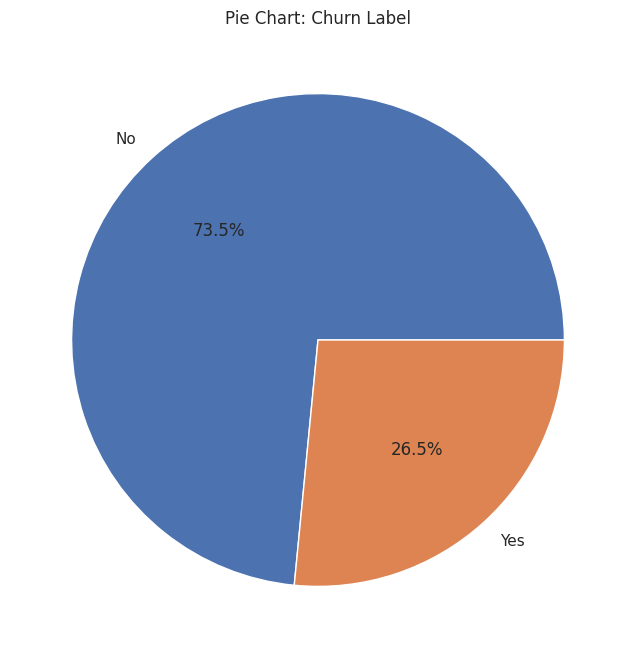

In [ ]:
# 7. Pie Chart
plt.figure(figsize=(8, 8))
df['Churn Label'].value_counts().plot.pie(autopct='%1.1f%%')
plt.title('Pie Chart: Churn Label')
plt.ylabel('')
plt.show()

**9. Donut Plot**

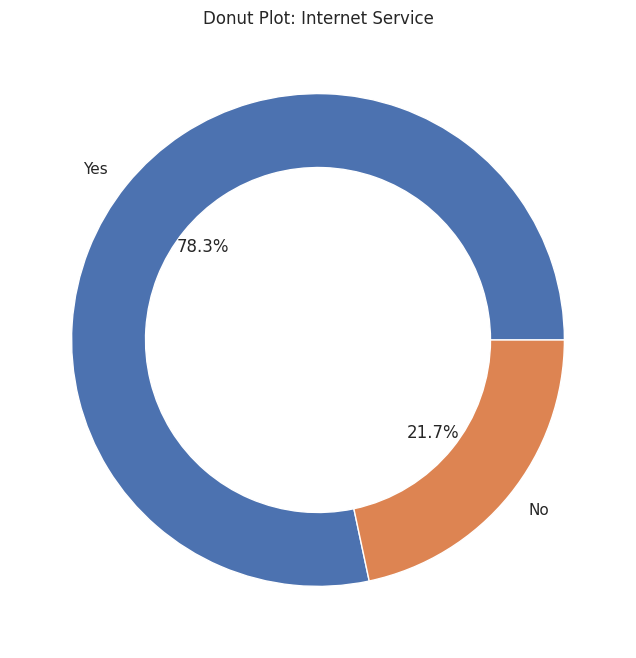

In [ ]:
# 8. Donut Plot
plt.figure(figsize=(8, 8))
data = df['Internet Service'].value_counts()
plt.pie(data, labels=data.index, autopct='%1.1f%%', wedgeprops=dict(width=0.3))
plt.title('Donut Plot: Internet Service')
plt.show()

**10. Box Plot**

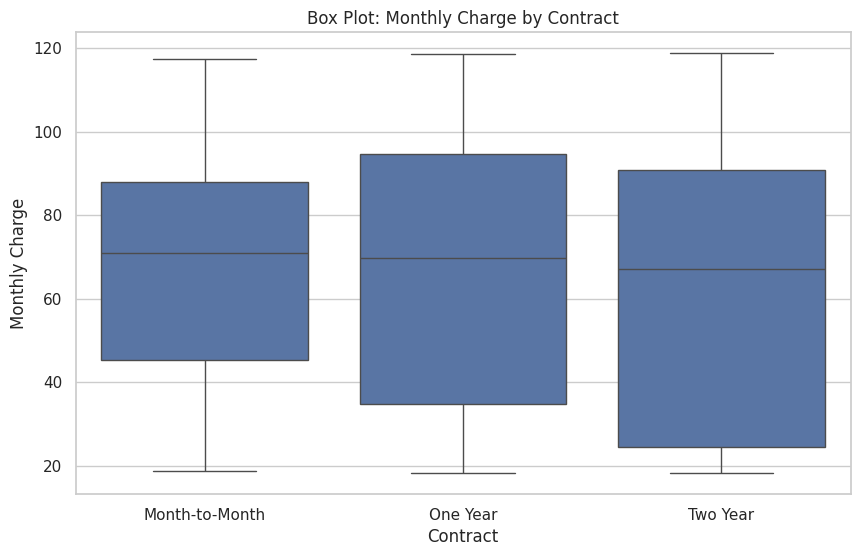

In [ ]:
# 9. Box Plot
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='Contract', y='Monthly Charge')
plt.title('Box Plot: Monthly Charge by Contract')
plt.show()

**11. Time Series Graph**

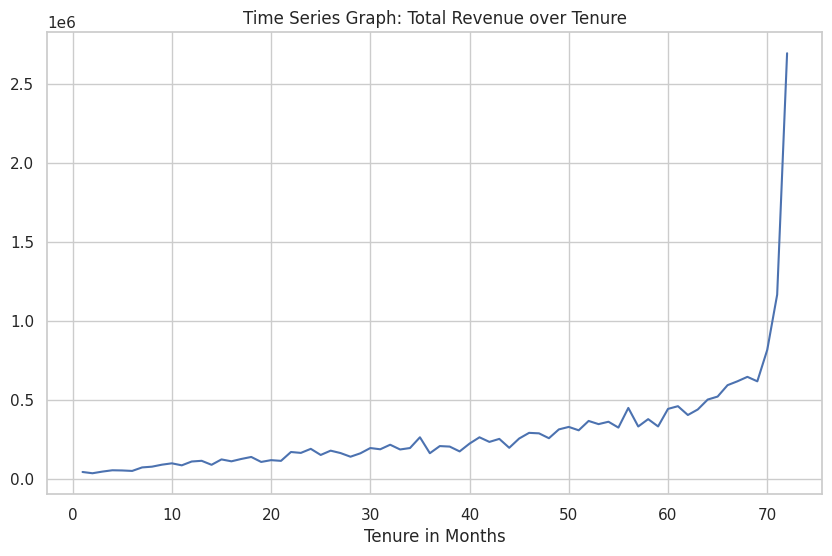

In [ ]:
# 10. Time Series (Using Tenure as a proxy for time)
ts_data = df.groupby('Tenure in Months')['Total Revenue'].sum()
plt.figure(figsize=(10, 6))
ts_data.plot()
plt.title('Time Series Graph: Total Revenue over Tenure')
plt.show()

**12. Violin Plot**

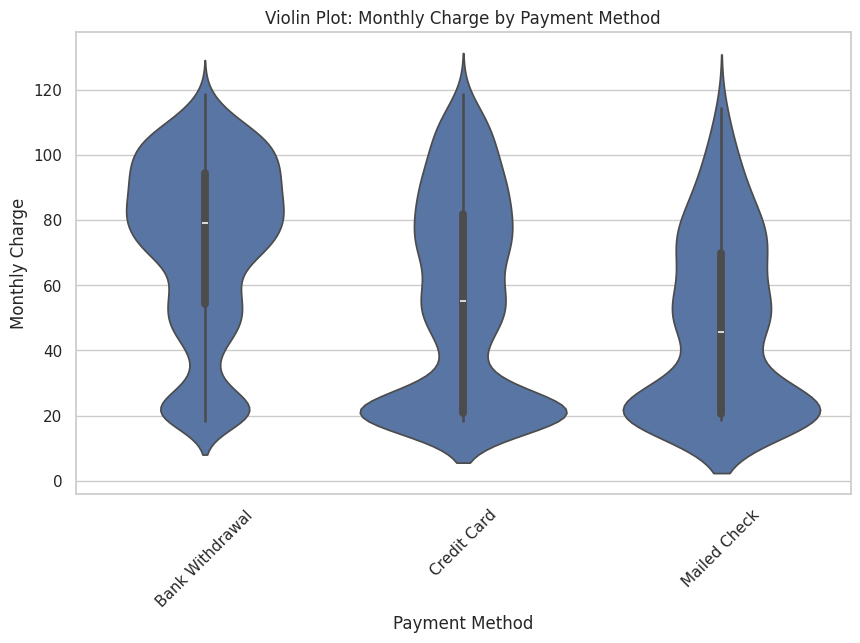

In [ ]:
# 11. Violin Plot
plt.figure(figsize=(10, 6))
sns.violinplot(data=df, x='Payment Method', y='Monthly Charge')
plt.xticks(rotation=45)
plt.title('Violin Plot: Monthly Charge by Payment Method')
plt.show()

**13. Violin and Box Plot**

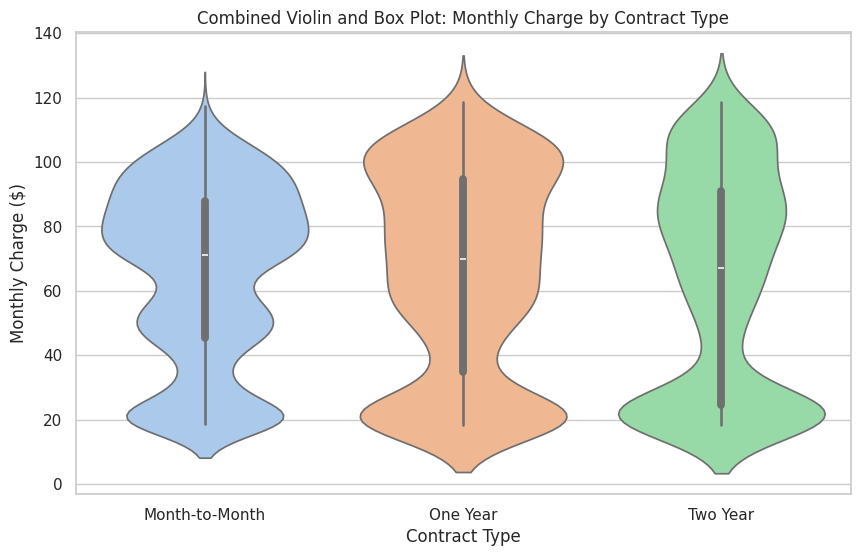

In [ ]:
# Create the combined Violin and Box Plot
plt.figure(figsize=(10, 6))
sns.violinplot(
    data=df,
    x='Contract',
    y='Monthly Charge',
    inner='box',  # This parameter embeds the box plot components (median, quartiles)
    hue='Contract', # Assign x variable to hue to resolve FutureWarning
    palette='pastel',
    legend=False # Set legend to False as x is assigned to hue
)

plt.title('Combined Violin and Box Plot: Monthly Charge by Contract Type')
plt.xlabel('Contract Type')
plt.ylabel('Monthly Charge ($)')
plt.show()

**14. Treemap**

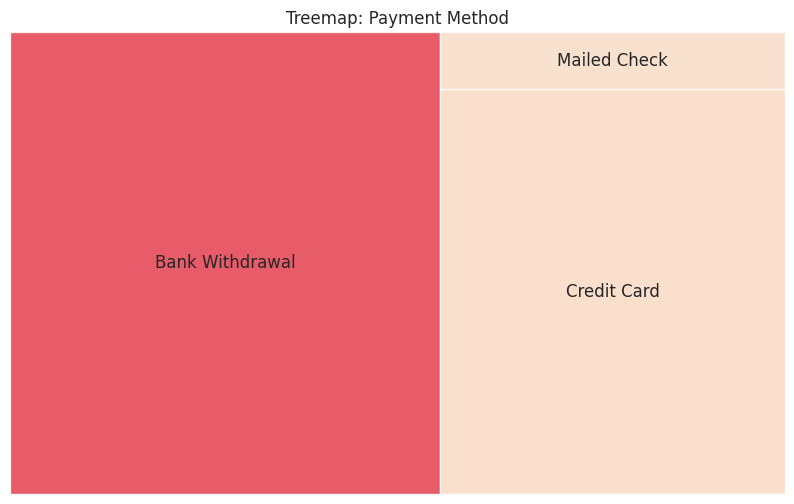

In [ ]:
# 12. Treemap
plt.figure(figsize=(10, 6))
counts = df['Payment Method'].value_counts()
squarify.plot(sizes=counts.values, label=counts.index, alpha=.8)
plt.title('Treemap: Payment Method')
plt.axis('off')
plt.show()

**15. Plotting Annotations**

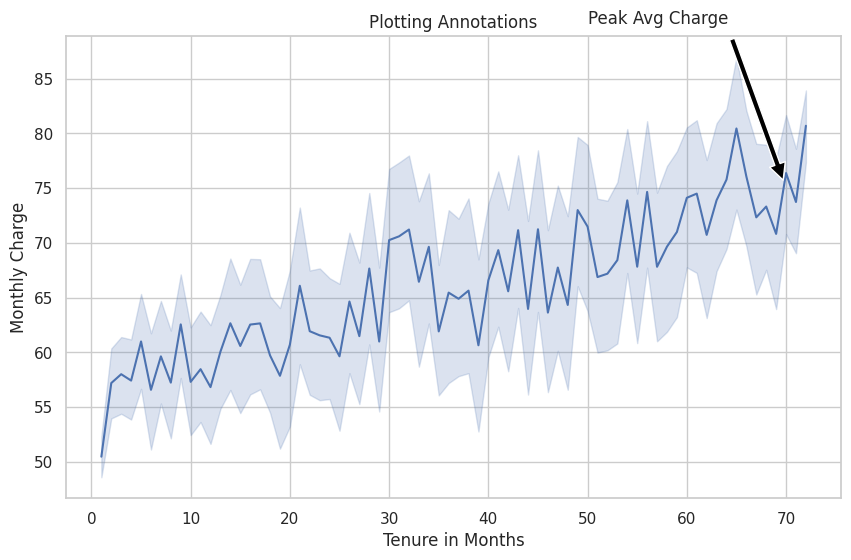

In [ ]:
# 13. Plotting Annotations
plt.figure(figsize=(10, 6))
sns.lineplot(data=df, x='Tenure in Months', y='Monthly Charge', estimator='mean')
plt.annotate('Peak Avg Charge', xy=(70, 75), xytext=(50, 90),
             arrowprops=dict(facecolor='black', shrink=0.05))
plt.title('Plotting Annotations')
plt.show()

**16. Word Cloud**

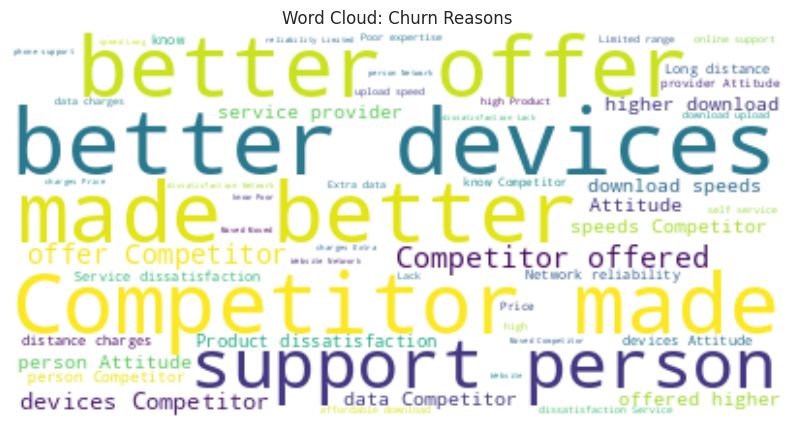

In [ ]:
# 14. Word Cloud
text = " ".join(review for review in df['Churn Reason'].dropna())
wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(text)
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title('Word Cloud: Churn Reasons')
plt.show()

**17. Visualizing a Neural Network Architecture**

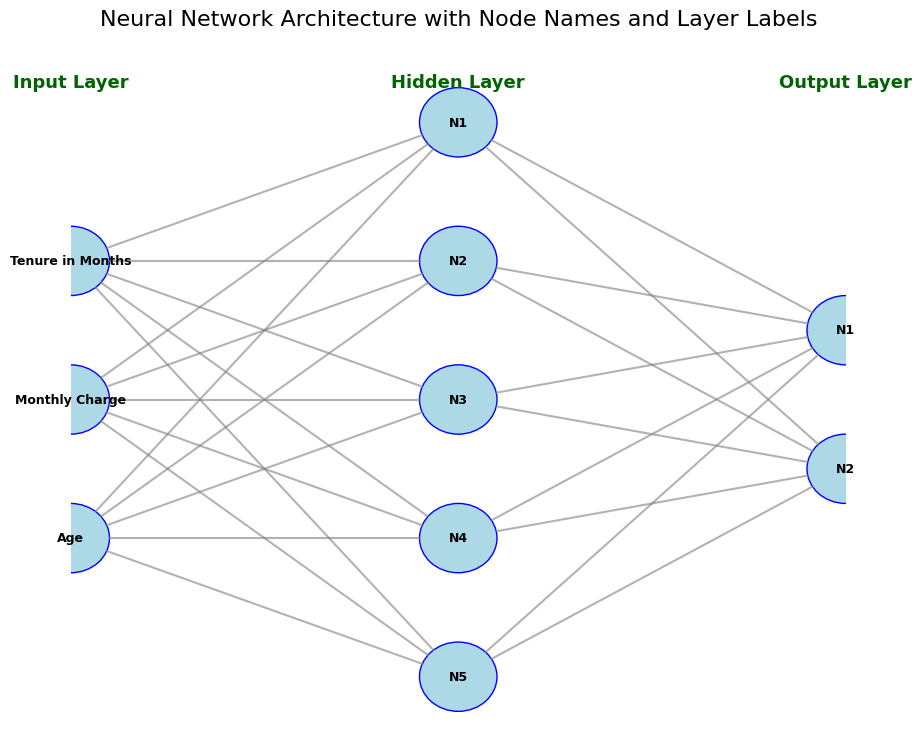

In [ ]:
import matplotlib.pyplot as plt, numpy as np

s=[3,5,2]; n=['Input Layer','Hidden Layer','Output Layer']; f=['Tenure in Months','Monthly Charge','Age']
v,h=1/max(s),1/(len(s)-1); t=[0.5+v*(x-1)/2 for x in s]
fig,ax=plt.subplots(figsize=(10,9)); ax.axis('off')

for i,x in enumerate(s):
  for j in range(x):
    X,Y=i*h,t[i]-j*v
    ax.add_artist(plt.Circle((X,Y),0.05,color='lightblue',ec='blue'))
    ax.text(X,Y,f[j] if i==0 and j<3 else f'N{j+1}',ha='center',va='center',fontsize=9,fontweight='bold')
  ax.text(i*h,0.95,n[i],ha='center',fontsize=13,fontweight='bold',color='darkgreen')

for i,(a,b) in enumerate(zip(s[:-1],s[1:])):
  for j in range(a):
    for k in range(b):
      ang=np.arctan2((t[i+1]-k*v)-(t[i]-j*v),h)
      ax.add_artist(plt.Line2D([i*h+0.05*np.cos(ang),(i+1)*h-0.05*np.cos(ang)],
                               [t[i]-j*v+0.05*np.sin(ang),t[i+1]-k*v-0.05*np.sin(ang)],
                               c='gray',alpha=0.6))

plt.title('Neural Network Architecture with Node Names and Layer Labels',fontsize=16,pad=20)
plt.show()

**18. Visualizing a Machine Learning Algorithm**

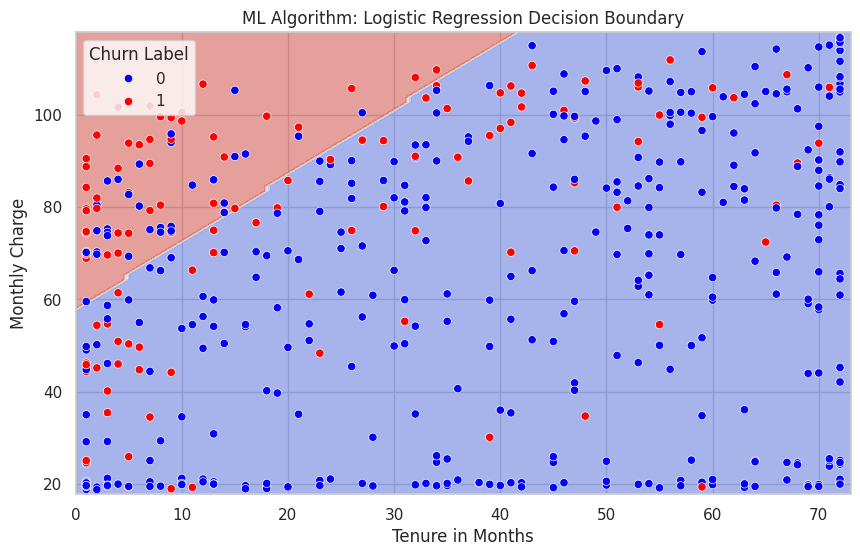

In [ ]:
# 16. Decision Boundary
sub_df = df.sample(500, random_state=42)
X = sub_df[['Tenure in Months', 'Monthly Charge']]
y = (sub_df['Churn Label'] == 'Yes').astype(int)
clf = LogisticRegression()
clf.fit(X, y)

fig, ax = plt.subplots(figsize=(10, 6))
DecisionBoundaryDisplay.from_estimator(clf, X, ax=ax, response_method="predict", cmap="coolwarm", alpha=0.5)
sns.scatterplot(x=X['Tenure in Months'], y=X['Monthly Charge'], hue=y, ax=ax, palette=['blue', 'red'])
plt.title('ML Algorithm: Logistic Regression Decision Boundary')
plt.show()

**19. Candlestick Chart**

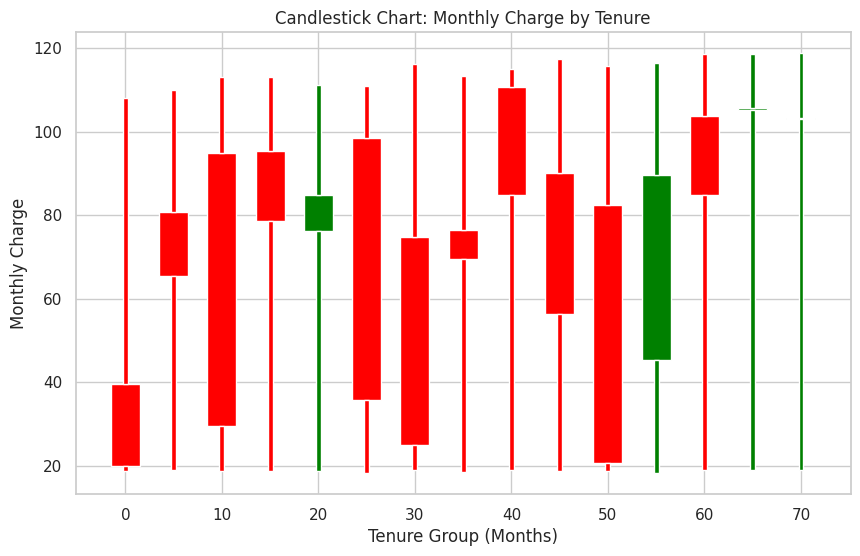

In [ ]:
# 17. Candlestick Chart (Simulated)
df['Tenure Group'] = (df['Tenure in Months'] // 5) * 5
ohlc = df.groupby('Tenure Group')['Monthly Charge'].agg(['first', 'max', 'min', 'last']).reset_index()
ohlc.columns = ['Tenure', 'Open', 'High', 'Low', 'Close']

fig, ax = plt.subplots(figsize=(10, 6))
width = 3
up = ohlc[ohlc.Close >= ohlc.Open]
down = ohlc[ohlc.Close < ohlc.Open]

ax.bar(up.Tenure, up.Close-up.Open, width, bottom=up.Open, color='green')
ax.bar(up.Tenure, up.High-up.Close, 0.5, bottom=up.Close, color='green')
ax.bar(up.Tenure, up.Low-up.Open, 0.5, bottom=up.Open, color='green')

ax.bar(down.Tenure, down.Close-down.Open, width, bottom=down.Open, color='red')
ax.bar(down.Tenure, down.High-down.Open, 0.5, bottom=down.Open, color='red')
ax.bar(down.Tenure, down.Low-down.Close, 0.5, bottom=down.Close, color='red')
plt.title('Candlestick Chart: Monthly Charge by Tenure')
plt.xlabel('Tenure Group (Months)') # Added x-axis label
plt.ylabel('Monthly Charge') # Added y-axis label
plt.show()

**20. Animated Scatter Plot**

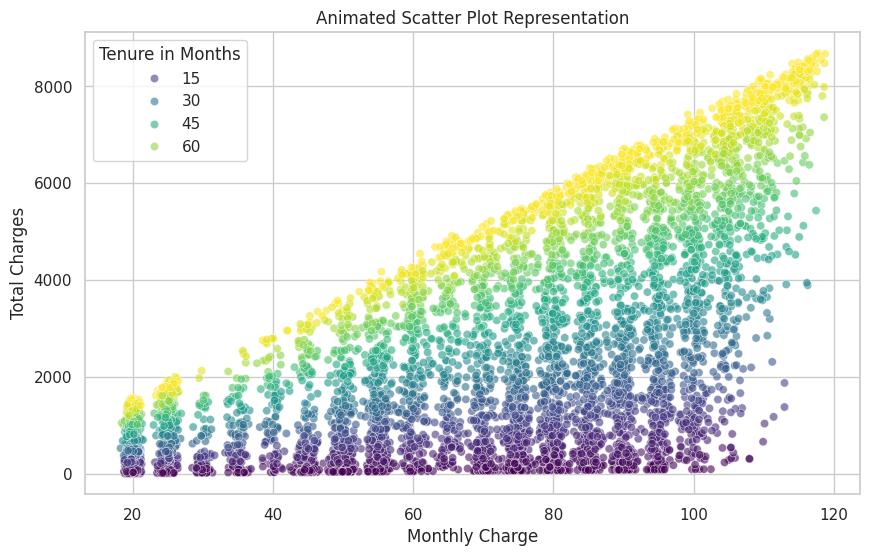

In [ ]:
# 18. Animated Scatter (Static Representation)
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='Monthly Charge', y='Total Charges', hue='Tenure in Months', palette='viridis', alpha=0.6)
plt.title('Animated Scatter Plot Representation')
plt.show()

In [ ]:
import pandas as pd
import plotly.express as px

# Load your dataset
df = pd.read_csv("/content/telco.csv")

# Convert important numeric columns
df["Monthly Charge"] = pd.to_numeric(df["Monthly Charge"], errors="coerce")
df["Total Revenue"] = pd.to_numeric(df["Total Revenue"], errors="coerce")
df["Tenure in Months"] = pd.to_numeric(df["Tenure in Months"], errors="coerce")
df["CLTV"] = pd.to_numeric(df["CLTV"], errors="coerce")

# Animated scatter plot
fig = px.scatter(
    df,
    x="Monthly Charge",
    y="Total Revenue",
    animation_frame="Tenure in Months",   # Animation just like Gapminder "year"
    animation_group="Customer ID",
    size="CLTV",                           # Bubble size
    color="Churn Label",                   # Bubble color
    hover_name="Customer ID",
    size_max=20,
    range_x=[0, df["Monthly Charge"].max()],
    range_y=[0, df["Total Revenue"].max()]
)

fig.show()


**21. Sunburst Plot**

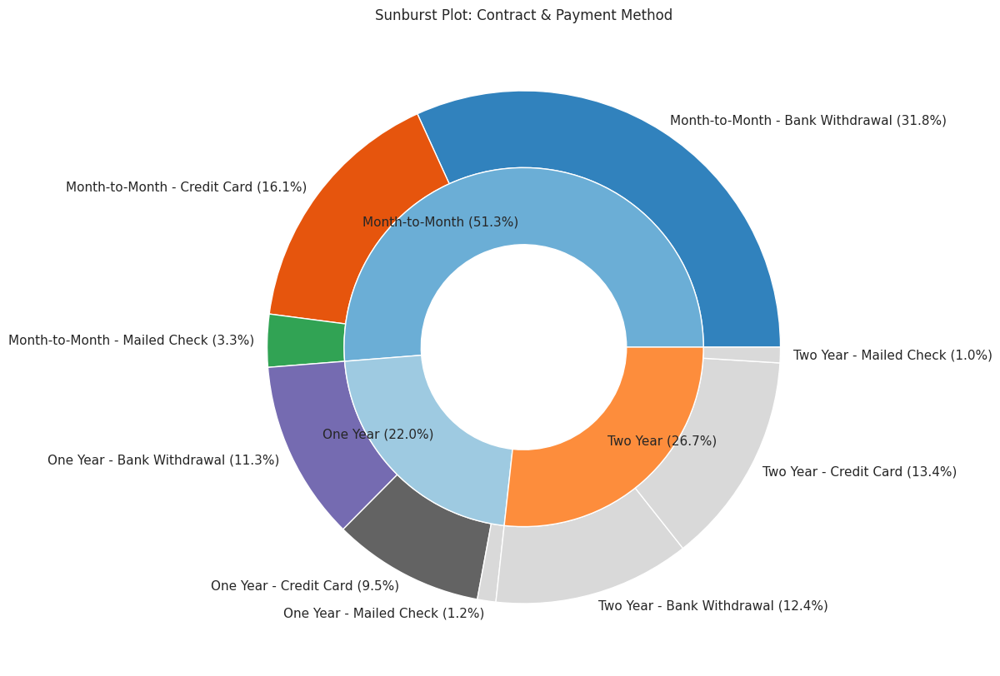

In [ ]:
total_customers = len(df)

# 19. Sunburst Plot
plt.figure(figsize=(10, 10))
size = 0.3
vals_outer = df.groupby(['Contract', 'Payment Method']).size()
vals_inner = df.groupby('Contract').size()
cmap = plt.get_cmap("tab20c")
outer_colors = cmap(np.arange(len(vals_outer))*4)
inner_colors = cmap(np.array([1, 2, 5, 6, 9, 10]))

# Prepare labels for the inner ring (Contract Type)
inner_labels = []
for contract_type, count in vals_inner.items():
    percentage = (count / total_customers) * 100
    inner_labels.append(f'{contract_type} ({percentage:.1f}%)')

# Prepare labels for the outer ring (Contract Type - Payment Method)
outer_labels = []
for (contract_type, payment_method), count in vals_outer.items():
    percentage = (count / total_customers) * 100
    outer_labels.append(f'{contract_type} - {payment_method} ({percentage:.1f}%)')

plt.pie(vals_outer, radius=1, colors=outer_colors, wedgeprops=dict(width=size, edgecolor='w'), labels=outer_labels, labeldistance=1.05)
plt.pie(vals_inner, radius=1-size, colors=inner_colors, wedgeprops=dict(width=size, edgecolor='w'), labels=inner_labels, labeldistance=0.7)
plt.title('Sunburst Plot: Contract & Payment Method')
plt.show()

**22. Visualizing a Decision Tree**

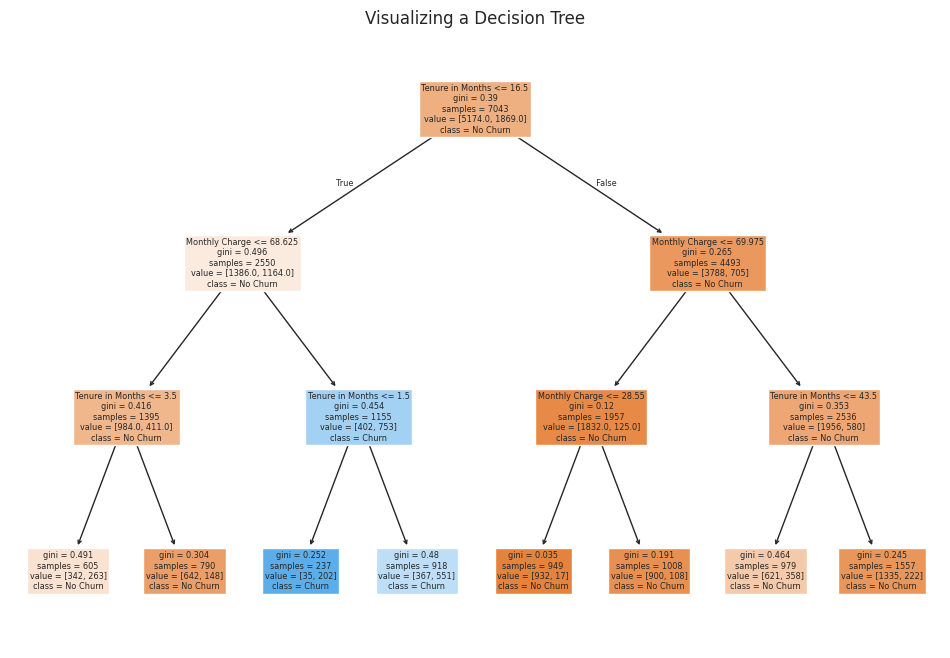

In [ ]:
# 21. Decision Tree Visualization
X = df[['Tenure in Months', 'Monthly Charge']] # Simplified features
y = (df['Churn Label'] == 'Yes').astype(int)
dt = DecisionTreeClassifier(max_depth=3, random_state=42)
dt.fit(X, y)

plt.figure(figsize=(12, 8))
plot_tree(dt, feature_names=X.columns, class_names=['No Churn', 'Churn'], filled=True)
plt.title('Visualizing a Decision Tree')
plt.show()

**23. AUC Curve & ROC Curve**

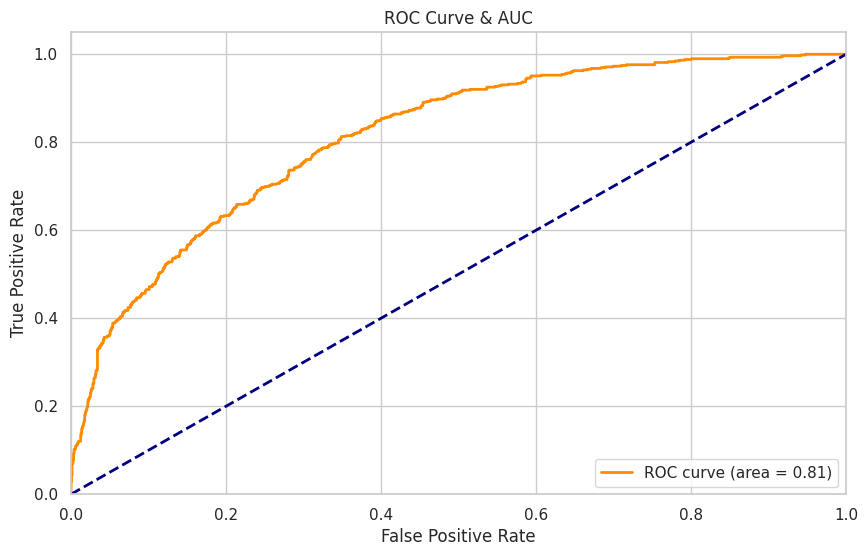

In [ ]:
# 22 & 23. ROC Curve and AUC
# Prepare data
X = df[['Tenure in Months', 'Monthly Charge']]
y = (df['Churn Label'] == 'Yes').astype(int)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train model
model = LogisticRegression()
model.fit(X_train, y_train)
y_score = model.predict_proba(X_test)[:, 1]

# Calculate ROC
fpr, tpr, _ = roc_curve(y_test, y_score)
roc_auc = auc(fpr, tpr)

# Plot
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve & AUC')
plt.legend(loc="lower right")
plt.show()

**24. Pair Plots**

<Figure size 1200x1000 with 0 Axes>

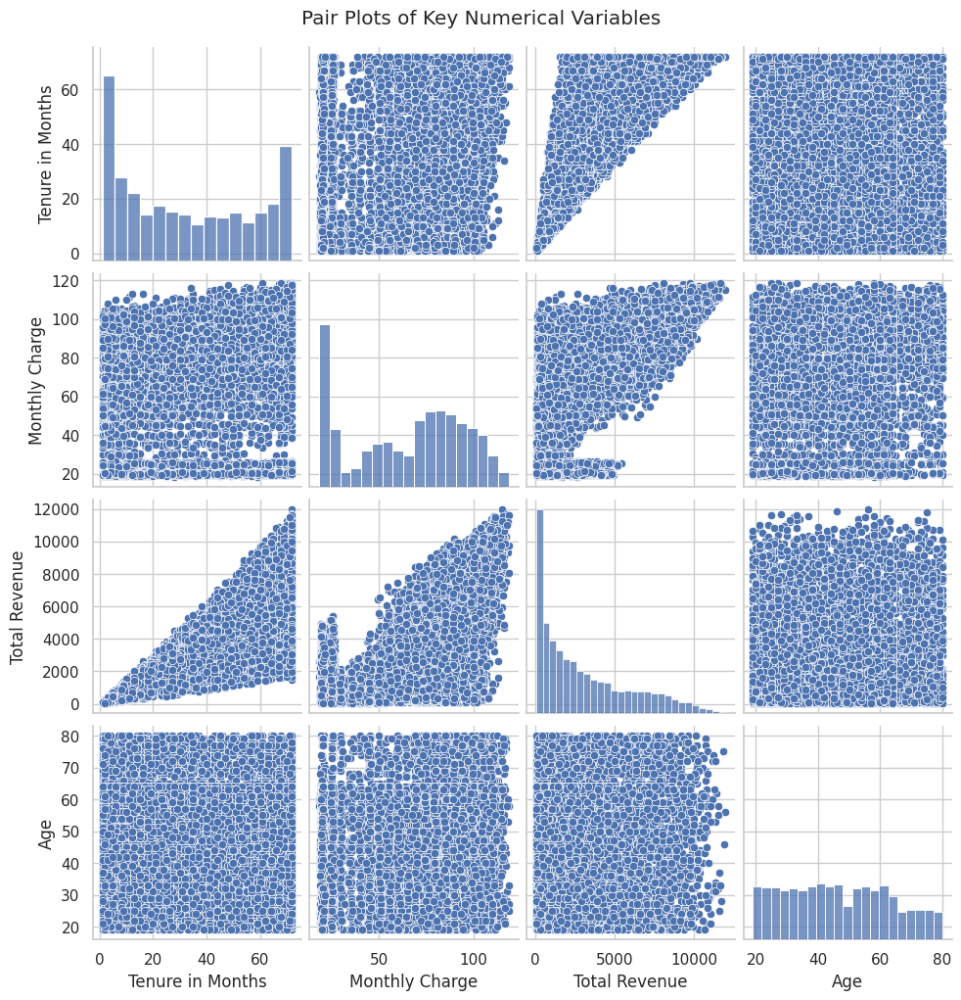

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select relevant numerical columns for pairplot
pairplot_cols = ['Tenure in Months', 'Monthly Charge', 'Total Revenue', 'Age']

# Create the pairplot
plt.figure(figsize=(12, 10)) # Adjust figure size for better readability
sns.pairplot(df[pairplot_cols])
plt.suptitle('Pair Plots of Key Numerical Variables', y=1.02) # Add a main title above subplots
plt.show()

**25. Choropleth Map**

Data Head :
          State Name                                           Geometry  \
0  Arunachal Pradesh  POLYGON ((96.16260946675357 29.38078474502004,...   
1              Assam  MULTIPOLYGON (((89.74322932956994 26.303620341...   
2              Bihar  MULTIPOLYGON (((84.50719832504274 24.263231032...   
3       Chhattisgarh  POLYGON ((83.33531747931829 24.09885072448139,...   
4                Goa  MULTIPOLYGON (((74.11917887850251 14.753440750...   

  NSDP Per Capita (Nominal)1996-97 NSDP Per Capita (Nominal)2000-01  \
0                         ₹ 10,816                         ₹ 15,260   
1                          ₹ 7,394                         ₹ 12,803   
2                          ₹ 4,001                          ₹ 6,415   
3                          ₹ 8,353                         ₹ 10,744   
4                         ₹ 26,418                         ₹ 43,735   

  NSDP Per Capita (Nominal)2005-06 NSDP Per Capita (Nominal)2010-11  \
0                         ₹ 28,171     

<Figure size 2000x1000 with 0 Axes>

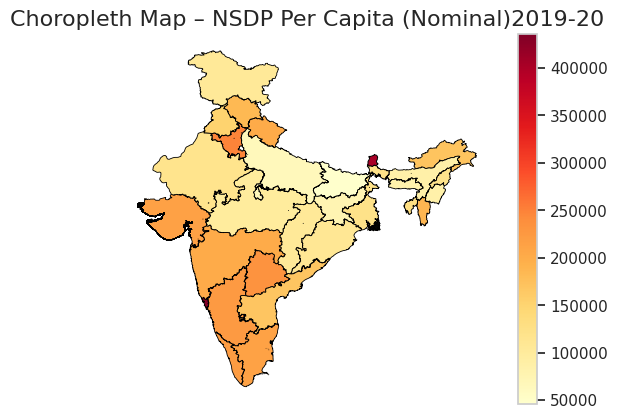

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# Load your dataset
df = pd.read_csv("/content/data.csv")
print("Data Head :")
print(df.head())
print("Shape of the Dataset: ",df.shape)

# Convert "Geometry" column to shapely geometry
gdf = gpd.GeoDataFrame(df, geometry=gpd.GeoSeries.from_wkt(df["Geometry"]))

# --- Select the column to visualize ---
column_to_plot = "NSDP Per Capita (Nominal)2019-20"

# Convert rupee strings ("₹ 1,69,742") to numbers
gdf[column_to_plot] = (
    gdf[column_to_plot]
    .str.replace("₹", "", regex=False)
    .str.replace(",", "", regex=False)
    .astype(float)
)

# Plot Choropleth Map
plt.figure(figsize=(20, 10))
gdf.plot(
    column=column_to_plot,
    cmap="YlOrRd",
    legend=True,
    edgecolor="black",
    linewidth=0.6
)

plt.title(f"Choropleth Map – {column_to_plot}", fontsize=16)
plt.axis("off")
plt.show()


Data Head :
          State Name                                           Geometry  \
0  Arunachal Pradesh  POLYGON ((96.16260946675357 29.38078474502004,...   
1              Assam  MULTIPOLYGON (((89.74322932956994 26.303620341...   
2              Bihar  MULTIPOLYGON (((84.50719832504274 24.263231032...   
3       Chhattisgarh  POLYGON ((83.33531747931829 24.09885072448139,...   
4                Goa  MULTIPOLYGON (((74.11917887850251 14.753440750...   

  NSDP Per Capita (Nominal)1996-97 NSDP Per Capita (Nominal)2000-01  \
0                         ₹ 10,816                         ₹ 15,260   
1                          ₹ 7,394                         ₹ 12,803   
2                          ₹ 4,001                          ₹ 6,415   
3                          ₹ 8,353                         ₹ 10,744   
4                         ₹ 26,418                         ₹ 43,735   

  NSDP Per Capita (Nominal)2005-06 NSDP Per Capita (Nominal)2010-11  \
0                         ₹ 28,171     

<Figure size 1200x1000 with 0 Axes>

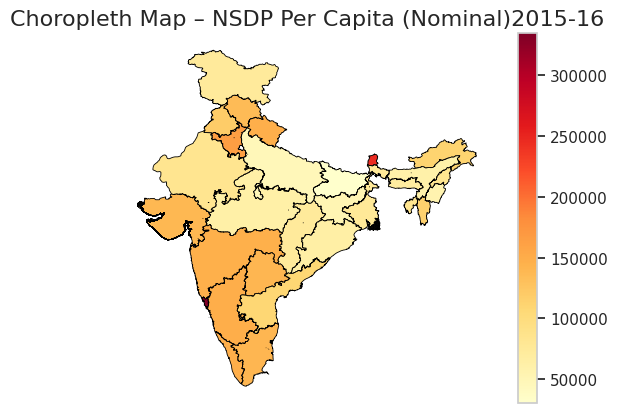

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# Load your dataset
df = pd.read_csv("/content/data.csv")
print("Data Head :")
print(df.head())
print("Shape of the Dataset: ",df.shape)

# Convert "Geometry" column to shapely geometry
gdf = gpd.GeoDataFrame(df, geometry=gpd.GeoSeries.from_wkt(df["Geometry"]))

# --- Select the column to visualize ---
column_to_plot = "NSDP Per Capita (Nominal)2015-16"

# Convert rupee strings ("₹ 1,69,742") to numbers
gdf[column_to_plot] = (
    gdf[column_to_plot]
    .str.replace("₹", "", regex=False)
    .str.replace(",", "", regex=False)
    .astype(float)
)

# Plot Choropleth Map
plt.figure(figsize=(12, 10))
gdf.plot(
    column=column_to_plot,
    cmap="YlOrRd",
    legend=True,
    edgecolor="black",
    linewidth=0.6
)

plt.title(f"Choropleth Map – {column_to_plot}", fontsize=16)
plt.axis("off")
plt.show()


Data Head :
          State Name                                           Geometry  \
0  Arunachal Pradesh  POLYGON ((96.16260946675357 29.38078474502004,...   
1              Assam  MULTIPOLYGON (((89.74322932956994 26.303620341...   
2              Bihar  MULTIPOLYGON (((84.50719832504274 24.263231032...   
3       Chhattisgarh  POLYGON ((83.33531747931829 24.09885072448139,...   
4                Goa  MULTIPOLYGON (((74.11917887850251 14.753440750...   

  NSDP Per Capita (Nominal)1996-97 NSDP Per Capita (Nominal)2000-01  \
0                         ₹ 10,816                         ₹ 15,260   
1                          ₹ 7,394                         ₹ 12,803   
2                          ₹ 4,001                          ₹ 6,415   
3                          ₹ 8,353                         ₹ 10,744   
4                         ₹ 26,418                         ₹ 43,735   

  NSDP Per Capita (Nominal)2005-06 NSDP Per Capita (Nominal)2010-11  \
0                         ₹ 28,171     

<Figure size 1200x1000 with 0 Axes>

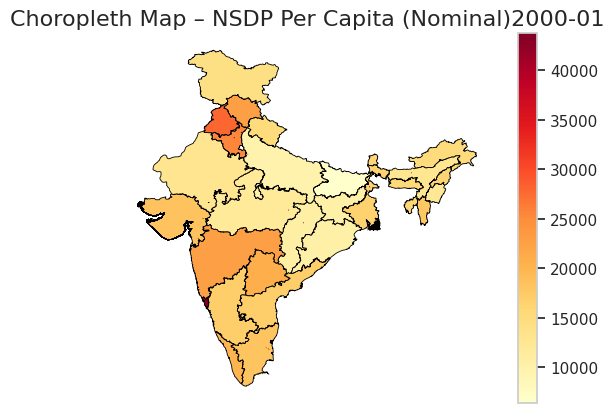

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# Load your dataset
df = pd.read_csv("/content/data.csv")
print("Data Head :")
print(df.head())
print("Shape of the Dataset: ",df.shape)

# Convert "Geometry" column to shapely geometry
gdf = gpd.GeoDataFrame(df, geometry=gpd.GeoSeries.from_wkt(df["Geometry"]))

# --- Select the column to visualize ---
column_to_plot = "NSDP Per Capita (Nominal)2000-01"

# Convert rupee strings ("₹ 1,69,742") to numbers
gdf[column_to_plot] = (
    gdf[column_to_plot]
    .str.replace("₹", "", regex=False)
    .str.replace(",", "", regex=False)
    .astype(float)
)

# Plot Choropleth Map
plt.figure(figsize=(12, 10))
gdf.plot(
    column=column_to_plot,
    cmap="YlOrRd",
    legend=True,
    edgecolor="black",
    linewidth=0.6
)

plt.title(f"Choropleth Map – {column_to_plot}", fontsize=16)
plt.axis("off")
plt.show()


In [ ]:
import plotly.express as px
import geopandas as gpd
import pandas as pd

# Load your dataset
df_map = pd.read_csv("/content/data.csv")
print("Data Head :")
print(df.head())
print("Shape of the Dataset: ",df.shape)
# Convert "Geometry" column to shapely geometry
gdf_map = gpd.GeoDataFrame(df_map, geometry=gpd.GeoSeries.from_wkt(df_map["Geometry"]))

# --- Select the column to visualize ---
column_to_plot = "NSDP Per Capita (Nominal)2019-20"

# Convert rupee strings ("₹ 1,69,742") to numbers
gdf_map[column_to_plot] = (
    gdf_map[column_to_plot]
    .str.replace("₹", "", regex=False)
    .str.replace(",", "", regex=False)
    .astype(float)
)

# Create an interactive choropleth map using plotly.express
fig = px.choropleth(
    gdf_map,
    geojson=gdf_map.geometry,
    locations=gdf_map.index,
    color=column_to_plot,
    hover_name="State Name",
    color_continuous_scale="YlOrRd",
    title=f"Interactive Choropleth Map – {column_to_plot}"
)

fig.update_geos(fitbounds="locations", visible=False)
fig.show()

Data Head :
          State Name                                           Geometry  \
0  Arunachal Pradesh  POLYGON ((96.16260946675357 29.38078474502004,...   
1              Assam  MULTIPOLYGON (((89.74322932956994 26.303620341...   
2              Bihar  MULTIPOLYGON (((84.50719832504274 24.263231032...   
3       Chhattisgarh  POLYGON ((83.33531747931829 24.09885072448139,...   
4                Goa  MULTIPOLYGON (((74.11917887850251 14.753440750...   

  NSDP Per Capita (Nominal)1996-97 NSDP Per Capita (Nominal)2000-01  \
0                         ₹ 10,816                         ₹ 15,260   
1                          ₹ 7,394                         ₹ 12,803   
2                          ₹ 4,001                          ₹ 6,415   
3                          ₹ 8,353                         ₹ 10,744   
4                         ₹ 26,418                         ₹ 43,735   

  NSDP Per Capita (Nominal)2005-06 NSDP Per Capita (Nominal)2010-11  \
0                         ₹ 28,171     